# Proyecto de visualización de datos (Parte II)

### Análisis exploratorio de los datos (fifa21_clean.csv)

**Autor:** Fernando José Cofiño Gavito

### 0. Carga de librerías y dataset

In [1]:
# Librerías y dependencias
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
import plotly.graph_objects as go

In [2]:
# Configurar estilo de gráficos
plt.style.use('ggplot')

In [3]:
# Cargar el dataset
fifa_data = pd.read_csv('fifa21_clean.csv', low_memory=False)

### 1. Información general del dataset

In [4]:
# Mostrar cabecera del dataset inicial
fifa_data.head()

,playerName,playerLongName,photoUrl,nationality,age,overallRating,potential,club,positions,preferredFoot,...,weakFoot,skillMoves,attackingWork,defensiveWork,reputation,playerState,dateStartContract,dateEndContract,heightCm,weightKg
0,L. Messi,Lionel Messi,https://cdn.sofifa.com/players/158/023/21_60.png,Argentina,33,93,93,FC Barcelona,"ED, DC, MP",Left,...,80,80,67,33,99,Con Contrato,2004-07-01,2021-06-30,170,72
1,Cristiano Ronaldo,C. Ronaldo dos Santos Aveiro,https://cdn.sofifa.com/players/020/801/21_60.png,Portugal,35,92,92,Juventus,"DC, EI",Right,...,80,99,99,33,99,Con Contrato,2018-07-10,2022-06-30,187,83
2,J. Oblak,Jan Oblak,https://cdn.sofifa.com/players/200/389/21_60.png,Slovenia,27,91,93,Atlético Madrid,POR,Right,...,60,20,67,67,60,Con Contrato,2014-07-16,2023-06-30,188,87
3,K. De Bruyne,Kevin De Bruyne,https://cdn.sofifa.com/players/192/985/21_60.png,Belgium,29,91,91,Manchester City,"MCO, MC",Right,...,99,80,99,99,80,Con Contrato,2015-08-30,2023-06-30,181,70
4,Neymar Jr,Neymar da Silva Santos Jr.,https://cdn.sofifa.com/players/190/871/21_60.png,Brazil,28,91,91,Paris Saint-Germain,"EI, MCO",Right,...,99,99,99,67,99,Con Contrato,2017-08-03,2022-06-30,175,68


In [5]:
# Resumen de las columnas con las que contamos
fifa_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18979 entries, 0 to 18978
Data columns (total 59 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   playerName         18979 non-null  object
 1   playerLongName     18979 non-null  object
 2   photoUrl           18979 non-null  object
 3   nationality        18979 non-null  object
 4   age                18979 non-null  int64 
 5   overallRating      18979 non-null  int64 
 6   potential          18979 non-null  int64 
 7   club               18979 non-null  object
 8   positions          18979 non-null  object
 9   preferredFoot      18979 non-null  object
 10  bestOverallRating  18979 non-null  int64 
 11  bestPosition       18979 non-null  object
 12  value              18979 non-null  int64 
 13  wage               18979 non-null  int64 
 14  releaseClause      18979 non-null  int64 
 15  crossing           18979 non-null  int64 
 16  finishing          18979 non-null  int64

In [6]:
# Resumen del dataset
fifa_data.describe()

,age,overallRating,potential,bestOverallRating,value,wage,releaseClause,crossing,finishing,heading,...,gkKicking,gkPositioning,gkReflexes,weakFoot,skillMoves,attackingWork,defensiveWork,reputation,heightCm,weightKg
count,18979.000000,18979.000000,18979.000000,18979.000000,1.897900e+04,18979.000000,1.897900e+04,18979.000000,18979.000000,18979.000000,...,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000
mean,25.194109,65.718636,71.136414,66.751726,2.865063e+06,8972.337847,3.962951e+06,49.688392,45.842405,51.942726,...,16.076453,16.217187,16.519627,58.795353,47.296749,74.142421,69.466937,21.832236,181.200221,75.019021
std,4.710520,6.968999,6.114635,6.747193,7.685154e+06,19759.853528,9.772762e+06,18.131153,19.567081,17.294409,...,16.491103,17.002239,17.854079,13.323518,15.312401,17.164277,16.641696,7.231810,6.840054,7.073542
min,16.000000,47.000000,47.000000,48.000000,0.000000e+00,0.000000,0.000000e+00,6.000000,3.000000,5.000000,...,2.000000,2.000000,2.000000,20.000000,20.000000,33.000000,33.000000,20.000000,155.000000,50.000000
25%,21.000000,61.000000,67.000000,62.000000,4.750000e+05,1000.000000,4.235000e+05,38.000000,30.000000,44.000000,...,8.000000,8.000000,8.000000,60.000000,40.000000,67.000000,67.000000,20.000000,176.000000,70.000000
50%,25.000000,66.000000,71.000000,67.000000,9.500000e+05,3000.000000,1.000000e+06,54.000000,49.000000,55.000000,...,11.000000,11.000000,11.000000,60.000000,40.000000,67.000000,67.000000,20.000000,181.000000,75.000000
75%,29.000000,70.000000,75.000000,71.000000,2.000000e+06,8000.000000,2.800000e+06,63.000000,62.000000,64.000000,...,14.000000,14.000000,14.000000,60.000000,60.000000,99.000000,67.000000,20.000000,186.000000,80.000000
max,53.000000,93.000000,95.000000,93.000000,1.855000e+08,560000.000000,2.031000e+08,94.000000,95.000000,93.000000,...,93.000000,91.000000,90.000000,99.000000,99.000000,99.000000,99.000000,99.000000,206.000000,110.000000


### 2. Nacionalidad

In [7]:
# Crear un DataFrame para los 10 países más representados
top_10_countries_df = fifa_data['nationality'].value_counts().head(10).reset_index()
top_10_countries_df.columns = ['País', 'Cantidad de Jugadores']

# Crear un gráfico interactivo con Plotly
fig = px.bar(
    top_10_countries_df,
    x='País',
    y='Cantidad de Jugadores',
    title='Top 10 Países por Cantidad de Jugadores',
    text='Cantidad de Jugadores',
    labels={'País': 'País', 'Cantidad de Jugadores': 'Jugadores'},
    template='plotly_white',
    hover_data={'Cantidad de Jugadores': True}
)

# Personalizar el gráfico
fig.update_traces(marker_color='teal', marker_line_color='black', marker_line_width=1, textposition='outside')
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='País', tickangle=45, title_font_size=14),
    yaxis=dict(title='Cantidad de Jugadores', title_font_size=14),
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Arial"),
)

# Mostrar el gráfico interactivo
fig.show()

In [8]:
# Seleccionar los 5 países más representados
top_5_countries = fifa_data['nationality'].value_counts().head(5).index

# Calcular habilidades promedio por nacionalidad (top 5 países)
skill_columns = ['dribbling', 'shortPassing', 'finishing', 'standingTackle', 'sprintSpeed']
avg_skills_by_country = (
    fifa_data[fifa_data['nationality'].isin(top_5_countries)]
    .groupby('nationality')[skill_columns]
    .mean()
)

# Crear un gráfico interactivo con Plotly
fig = px.bar(
    avg_skills_by_country.T.reset_index(),
    x='index',
    y=top_5_countries,
    barmode='group',
    title='Habilidades Promedio por Nacionalidad (Top 5 Países)',
    labels={'index': 'Habilidad', 'value': 'Promedio', 'variable': 'País'},
    template='plotly_white'
)

# Personalizar el gráfico
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Habilidad', title_font_size=14),
    yaxis=dict(title='Promedio', title_font_size=14),
    legend_title='País',
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Arial"),
)

# Mostrar el gráfico interactivo
fig.show()

### 3. Club

In [9]:
# Calcular el valor promedio por club
avg_value_by_club = fifa_data.groupby('club')['value'].mean().sort_values(ascending=False).head(10).reset_index()
avg_value_by_club.columns = ['Club', 'Valor Promedio (€)']

# Convertir los valores promedio a millones y redondearlos
avg_value_by_club['Valor Promedio (€)'] = (avg_value_by_club['Valor Promedio (€)'] / 1e6).round(2)

# Crear un gráfico interactivo mejorado con Plotly
fig = px.bar(
    avg_value_by_club,
    x='Club',
    y='Valor Promedio (€)',
    title='Valor Promedio por Club (Top 10)',
    text='Valor Promedio (€)',
    labels={'Club': 'Club', 'Valor Promedio (€)': 'Valor Promedio (€M)'},
    template='plotly_white',
    hover_data={'Valor Promedio (€)': True}
)

# Personalizar el gráfico
fig.update_traces(
    marker_color='purple',
    marker_line_color='black',
    marker_line_width=1,
    textposition='outside',
    texttemplate='%{text}M'  # Mostrar valores en millones
)
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Club', tickangle=45, title_font_size=14),
    yaxis=dict(title='Valor Promedio (€M)', title_font_size=14),
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Arial"),
    uniformtext_minsize=10,  # Asegurar que el texto sea legible
    uniformtext_mode='hide'  # Evitar superposición de texto
)

# Mostrar el gráfico interactivo
fig.show()

In [10]:
# Calcular el valor total por club
total_value_by_club = fifa_data.groupby('club')['value'].sum().sort_values(ascending=False).head(10).reset_index()
total_value_by_club.columns = ['Club', 'Valor Total (€)']

# Convertir los valores a millones (€M) para mayor claridad
total_value_by_club['Valor Total (€)'] = (total_value_by_club['Valor Total (€)'] / 1e6).round(2)

# Crear un gráfico interactivo con Plotly
fig = px.bar(
    total_value_by_club,
    x='Club',
    y='Valor Total (€)',
    title='Valor Total por Club (Top 10)',
    text='Valor Total (€)',
    labels={'Club': 'Club', 'Valor Total (€)': 'Valor Total (€M)'},
    template='plotly_white',
    hover_data={'Valor Total (€)': True}
)

# Personalizar el gráfico
fig.update_traces(marker_color='darkorange', marker_line_color='black', marker_line_width=1, textposition='outside')
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Club', tickangle=45, title_font_size=14),
    yaxis=dict(title='Valor Total (€M)', title_font_size=14),
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Arial"),
)

# Mostrar el gráfico interactivo
fig.show()

In [11]:
# Crear una columna de duración del contrato en días
fifa_data['contract_duration'] = (
    pd.to_datetime(fifa_data['dateEndContract'], errors='coerce') -
    pd.to_datetime(fifa_data['dateStartContract'], errors='coerce')
).dt.days

# Calcular la duración promedio del contrato por club
avg_contract_duration_by_club = fifa_data.groupby('club')['contract_duration'].mean().sort_values(ascending=False).head(10).reset_index()
avg_contract_duration_by_club.columns = ['Club', 'Duración Promedio (días)']

# Crear un gráfico interactivo con Plotly
fig = px.bar(
    avg_contract_duration_by_club,
    x='Club',
    y='Duración Promedio (días)',
    title='Duración Promedio del Contrato por Club (Top 10)',
    text='Duración Promedio (días)',
    labels={'Club': 'Club', 'Duración Promedio (días)': 'Duración Promedio (días)'},
    template='plotly_white',
    hover_data={'Duración Promedio (días)': True}
)

# Personalizar el gráfico
fig.update_traces(marker_color='seagreen', marker_line_color='black', marker_line_width=1, textposition='outside')
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Club', tickangle=90, title_font_size=14),
    yaxis=dict(title='Duración Promedio (días)', title_font_size=14),
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Arial"),
)

# Mostrar el gráfico interactivo
fig.show()

### 4. Edad

In [12]:
# Histograma interactivo de edades
fig = px.histogram(
    fifa_data,
    x='age',
    nbins=20,
    title='Distribución de Edades de los Jugadores',
    labels={'age': 'Edad', 'count': 'Cantidad de Jugadores'},
    color_discrete_sequence=['coral']
)

# Ajustar diseño
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Edad', title_font_size=14),
    yaxis=dict(title='Cantidad de Jugadores', title_font_size=14),
    bargap=0.1
)

fig.show()

In [13]:
# Gráfico interactivo de dispersión entre edad y puntuación general
fig = px.scatter(
    fifa_data,
    x='age',
    y='overallRating',
    title='Relación entre Edad y Puntuación General',
    labels={'age': 'Edad', 'overallRating': 'Puntuación General'},
    opacity=0.7,
    color_discrete_sequence=['darkblue']
)

# Ajustar diseño
fig.update_traces(marker=dict(size=6))
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Edad', title_font_size=14),
    yaxis=dict(title='Puntuación General', title_font_size=14),
)

fig.show()

In [14]:
# Calcular habilidades promedio por edad
avg_skills_by_age = fifa_data.groupby('age')[['dribbling', 'shortPassing', 'finishing', 'standingTackle', 'sprintSpeed']].mean().reset_index()

# Gráfico interactivo de habilidades promedio por edad
fig = px.line(
    avg_skills_by_age,
    x='age',
    y=['dribbling', 'shortPassing', 'finishing', 'standingTackle', 'sprintSpeed'],
    title='Habilidades Promedio por Edad',
    labels={'value': 'Promedio de Habilidad', 'age': 'Edad', 'variable': 'Habilidad'},
)

# Ajustar diseño
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Edad', title_font_size=14),
    yaxis=dict(title='Promedio de Habilidad', title_font_size=14),
    legend_title='Habilidad'
)

fig.show()

In [15]:
# Boxplot interactivo de salarios por edad
fig = px.box(
    fifa_data,
    x='age',
    y='wage',
    title='Boxplot de Salario por Edad',
    labels={'age': 'Edad', 'wage': 'Salarios (€)'},
    template='plotly_white'
)

# Ajustar diseño
fig.update_traces(marker=dict(opacity=0.6, color='blue'))
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Edad', title_font_size=14),
    yaxis=dict(title='Salarios (€)', title_font_size=14),
)

fig.show()

### 5. Posición en el campo

In [16]:
import plotly.express as px

# Calcular el promedio de habilidades por posición
avg_skills_by_position = fifa_data.groupby('bestPosition')[['dribbling', 'shortPassing', 'finishing', 'standingTackle', 'sprintSpeed']].mean().reset_index()

# Crear un gráfico de barras interactivo
fig = px.bar(
    avg_skills_by_position.melt(id_vars='bestPosition', var_name='Habilidad', value_name='Promedio'),
    x='bestPosition',
    y='Promedio',
    color='Habilidad',
    barmode='group',
    title='Promedio de Habilidades por Posición',
    labels={'bestPosition': 'Posición', 'Promedio': 'Promedio de Habilidades'},
    template='plotly_white'
)

# Ajustar diseño
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Posición', title_font_size=14),
    yaxis=dict(title='Promedio de Habilidades', title_font_size=14),
    legend_title='Habilidad'
)

fig.show()

In [17]:
# Seleccionar posiciones y habilidades para el gráfico de radar
positions = avg_skills_by_position['bestPosition']
skills = ['dribbling', 'shortPassing', 'finishing', 'standingTackle', 'sprintSpeed']

# Crear datos para el radar
fig = go.Figure()

for position in positions:
    values = avg_skills_by_position[avg_skills_by_position['bestPosition'] == position][skills].values.flatten().tolist()
    fig.add_trace(go.Scatterpolar(
        r=values + [values[0]],  # Cerrar el ciclo
        theta=skills + [skills[0]],  # Cerrar el ciclo
        fill='toself',
        name=position
    ))

# Ajustar diseño del radar
fig.update_layout(
    polar=dict(
        radialaxis=dict(visible=True, range=[0, 100])
    ),
    title='Comparación de Habilidades por Posición',
    legend_title='Posición',
    template='plotly_white'
)

fig.show()

### 6. Habilidades y rendimiento

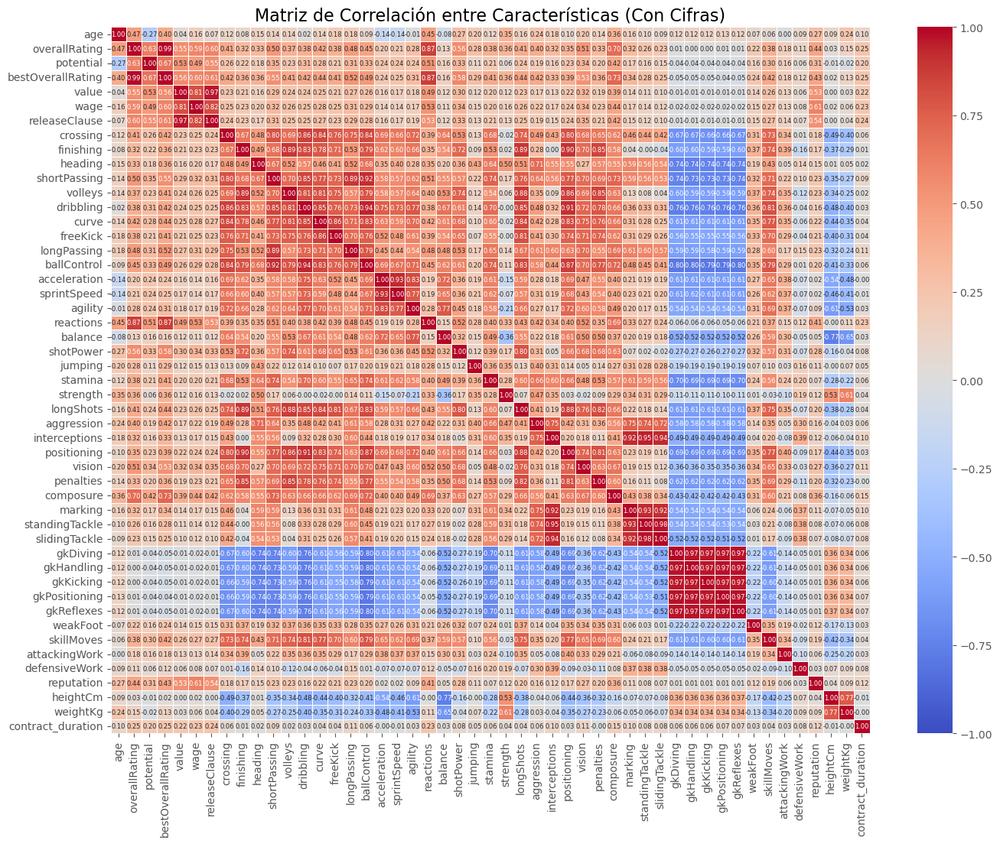

In [18]:
# Calcular la matriz de correlación para las características numéricas
correlation_matrix = fifa_data.select_dtypes(include=['float64', 'int64']).corr()

# Crear un mapa de calor para la matriz de correlación con cifras
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1, 
            annot_kws={"size": 6})
plt.title('Matriz de Correlación entre Características (Con Cifras)', fontsize=16)
plt.show()

In [19]:
# Seleccionar las habilidades y agrupar por pie preferido
skills = ['dribbling', 'shortPassing', 'finishing', 'standingTackle', 'sprintSpeed']
avg_skills_by_foot = fifa_data.groupby('preferredFoot')[skills].mean().reset_index()

# Crear un gráfico interactivo de habilidades promedio por pie preferido
fig = px.bar(
    avg_skills_by_foot.melt(id_vars='preferredFoot', var_name='Habilidad', value_name='Promedio'),
    x='Habilidad',
    y='Promedio',
    color='preferredFoot',
    barmode='group',
    title='Habilidades Promedio por Pie Preferido',
    labels={'preferredFoot': 'Pie Preferido', 'Promedio': 'Promedio de Habilidades'},
    template='plotly_white'
)

# Ajustar diseño del gráfico
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Habilidad', title_font_size=14),
    yaxis=dict(title='Promedio de Habilidades', title_font_size=14),
    legend_title='Pie Preferido'
)

fig.show()

In [20]:
# Seleccionar los 10 jugadores con mayor dribbling
top_dribblers = fifa_data.nlargest(10, 'dribbling')[['playerName', 'dribbling', 'club']]

# Crear un gráfico interactivo de los 10 mejores jugadores por dribbling
fig = px.bar(
    top_dribblers,
    x='dribbling',
    y='playerName',
    orientation='h',
    title='Top 10 Jugadores por Dribbling',
    labels={'dribbling': 'Dribbling', 'playerName': 'Jugador'},
    color='club',
    template='plotly_white'
)

# Ajustar diseño
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Dribbling', title_font_size=14),
    yaxis=dict(title='Jugador', title_font_size=14),
    legend_title='Club',
    yaxis_categoryorder='total ascending'  # Ordenar los jugadores por valor de dribbling
)

fig.show()

In [21]:
# Crear un DataFrame con las habilidades de velocidad
speed_data = fifa_data[['acceleration', 'sprintSpeed']].melt(var_name='Habilidad', value_name='Puntuación')

# Crear un gráfico de densidad interactivo con Plotly
fig = px.violin(
    speed_data,
    x='Habilidad',
    y='Puntuación',
    color='Habilidad',
    box=True,
    points='all',
    title='Distribución de Habilidades de Velocidad (Aceleración y Sprint)',
    labels={'Puntuación': 'Puntuación', 'Habilidad': 'Habilidad'},
    template='plotly_white'
)

# Ajustar diseño
fig.update_traces(meanline_visible=True)
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Habilidad', title_font_size=14),
    yaxis=dict(title='Puntuación', title_font_size=14)
)

fig.show()

### 7. Reputación

In [22]:
# Seleccionar los 20 jugadores con mayor reputación
top_reputation = fifa_data.nlargest(20, 'reputation')[['playerName', 'reputation', 'club']]

# Gráfico interactivo
fig = px.bar(
    top_reputation,
    x='reputation',
    y='playerName',
    color='club',
    orientation='h',
    title='Top 20 Jugadores por Reputación',
    labels={'reputation': 'Reputación', 'playerName': 'Jugador'},
    template='plotly_white'
)

fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Reputación', title_font_size=14),
    yaxis=dict(title='Jugador', title_font_size=14),
    legend_title='Club',
    yaxis_categoryorder='total ascending'
)

fig.show()

In [23]:
# Gráfico interactivo
fig = px.scatter(
    fifa_data,
    x='reputation',
    y='wage',
    title='Relación entre Fama y Salario',
    labels={'reputation': 'Reputación', 'wage': 'Salarios (€)'},
    opacity=0.6,
    color_discrete_sequence=['darkorange']
)

fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Reputación', title_font_size=14),
    yaxis=dict(title='Salarios (€)', title_font_size=14)
)

fig.show()

### 8. Estado del jugador, contrato y valor

In [24]:
# Gráfico interactivo
fig = px.scatter(
    fifa_data,
    x='value',
    y='wage',
    title='Relación entre Valor de Mercado y Salario',
    labels={'value': 'Valor de Mercado (€)', 'wage': 'Salarios (€)'},
    opacity=0.6,
    color_discrete_sequence=['green']
)

fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Valor de Mercado (€)', title_font_size=14),
    yaxis=dict(title='Salarios (€)', title_font_size=14)
)

fig.show()

In [25]:
# Crear un boxplot interactivo
fig = px.box(
    fifa_data,
    x='age',
    y='wage',
    title='Boxplot de Salario por Edad',
    labels={'age': 'Edad', 'wage': 'Salarios (€)'}
)

# Ajustar diseño
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Edad', title_font_size=14),
    yaxis=dict(title='Salarios (€)', title_font_size=14)
)

fig.show()

### 9. Características físicas (peso y altura)

In [26]:
# Seleccionar los jugadores más altos y más bajos
top_5_tallest = fifa_data.nlargest(5, 'heightCm')[['playerName', 'heightCm', 'club']]
top_5_shortest = fifa_data.nsmallest(5, 'heightCm')[['playerName', 'heightCm', 'club']]

# Gráfico interactivo para los más altos
fig_tallest = px.bar(
    top_5_tallest,
    x='heightCm',
    y='playerName',
    color='club',
    orientation='h',
    title='Top 5 Jugadores Más Altos',
    labels={'heightCm': 'Altura (cm)', 'playerName': 'Jugador'},
    template='plotly_white'
)

# Gráfico interactivo para los más bajos
fig_shortest = px.bar(
    top_5_shortest,
    x='heightCm',
    y='playerName',
    color='club',
    orientation='h',
    title='Top 5 Jugadores Más Bajos',
    labels={'heightCm': 'Altura (cm)', 'playerName': 'Jugador'},
    template='plotly_white'
)

fig_tallest.show()
fig_shortest.show()

In [27]:
# Crear un boxplot interactivo
fig = px.box(
    fifa_data,
    x='bestPosition',
    y='heightCm',
    title='Distribución de Altura por Posición',
    labels={'bestPosition': 'Posición', 'heightCm': 'Altura (cm)'}
)

# Ajustar diseño
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Posición', title_font_size=14),
    yaxis=dict(title='Altura (cm)', title_font_size=14)
)

fig.show()

In [28]:
# Calcular el peso promedio por club y seleccionar los 10 principales
avg_weight_by_club = fifa_data.groupby('club')['weightKg'].mean().sort_values(ascending=False).head(10).reset_index()

# Crear un gráfico interactivo
fig = px.bar(
    avg_weight_by_club,
    x='club',
    y='weightKg',
    title='Peso Promedio por Club (Top 10)',
    labels={'club': 'Club', 'weightKg': 'Peso Promedio (Kg)'},
    color_discrete_sequence=['brown'],
    template='plotly_white'
)

# Ajustar diseño
fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Club', tickangle=45, title_font_size=14),
    yaxis=dict(title='Peso Promedio (Kg)', title_font_size=14)
)

fig.show()

### 11. Otros aspectos alternativos

In [29]:
# Gráfico interactivo
fig = px.scatter(
    fifa_data,
    x='strength',
    y='overallRating',
    title='Relación entre Fuerza y Puntuación General',
    labels={'strength': 'Fuerza', 'overallRating': 'Puntuación General'},
    opacity=0.6,
    color_discrete_sequence=['purple']
)

fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Fuerza', title_font_size=14),
    yaxis=dict(title='Puntuación General', title_font_size=14)
)

fig.show()


In [30]:
# Gráfico interactivo
fig = px.scatter(
    fifa_data,
    x='aggression',
    y='marking',
    title='Relación entre Agresividad y Habilidades Defensivas',
    labels={'aggression': 'Agresividad', 'defense': 'Defensa'},
    opacity=0.6
)

fig.update_layout(
    title_font_size=18,
    xaxis=dict(title='Agresividad', title_font_size=14),
    yaxis=dict(title='Defensa', title_font_size=14)
)

fig.show()
